In [16]:
from rockpool.nn.networks import SynNet, WaveSenseNet
from torch.utils.data import Dataset,DataLoader
import pickle
thr = 1.0
thr_out = 2.0
snn = WaveSenseNet(n_channels_in=24, 
                   n_classes=4, 
                   dilations=[2,16,32],
                   threshold=thr, 
                   threshold_out=thr_out)

In [17]:
with open('/home/liruixin/workspace/gait_classification/data/dataset/train_dataset.pkl', 'rb') as file:
    train_dataset = pickle.load(file)
with open('/home/liruixin/workspace/gait_classification/data/dataset/test_dataset.pkl', 'rb') as file:
    test_dataset = pickle.load(file)

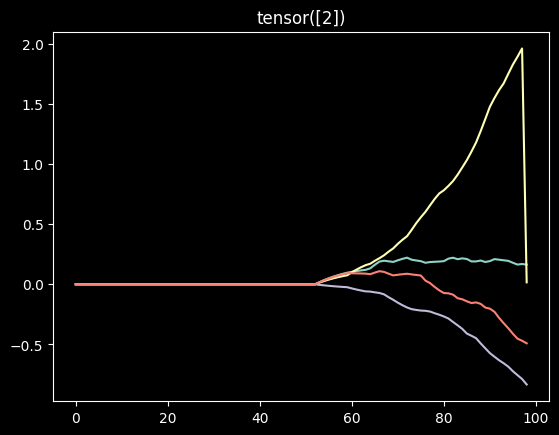

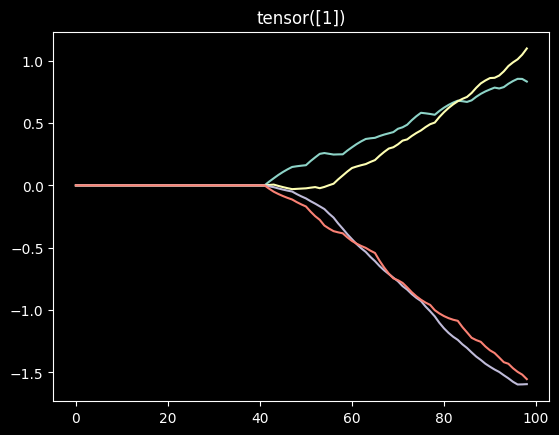

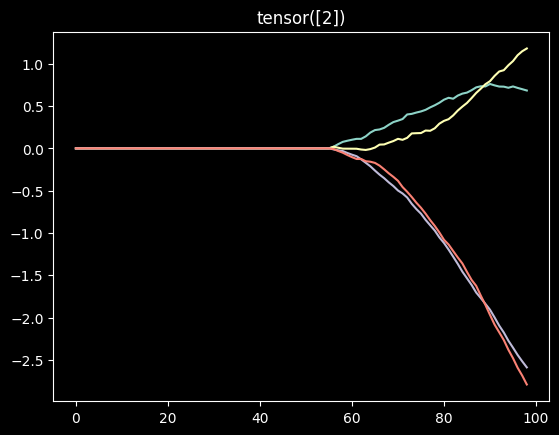

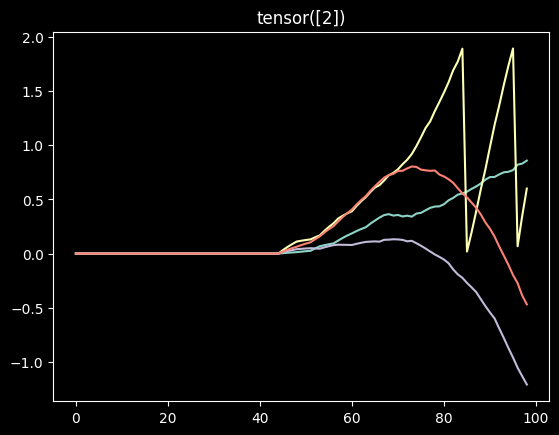

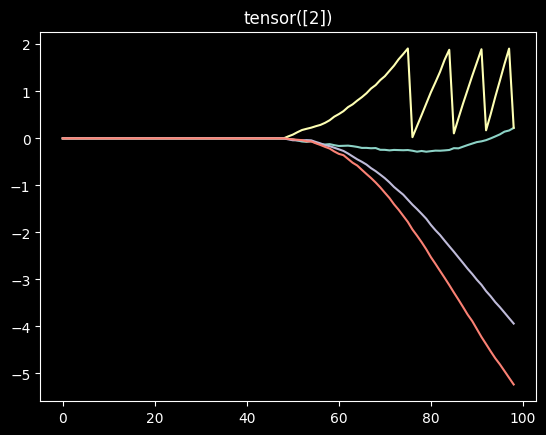

...

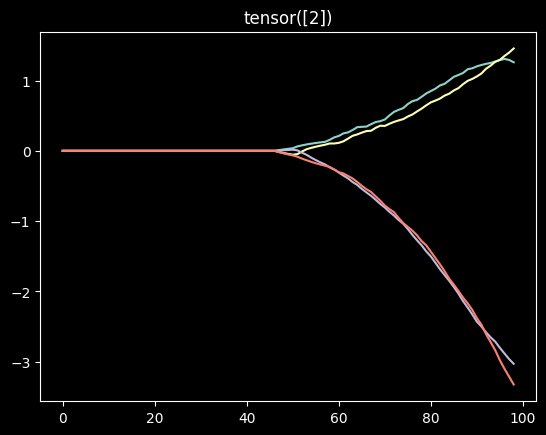

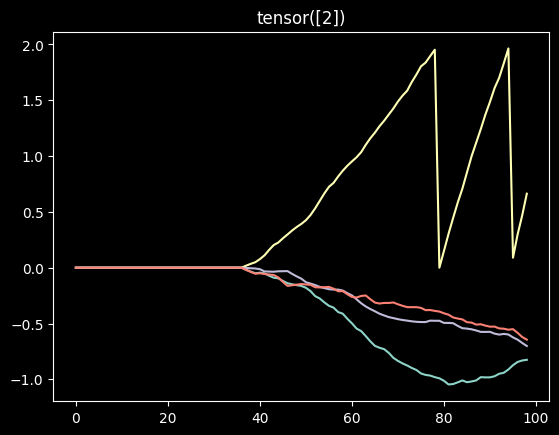

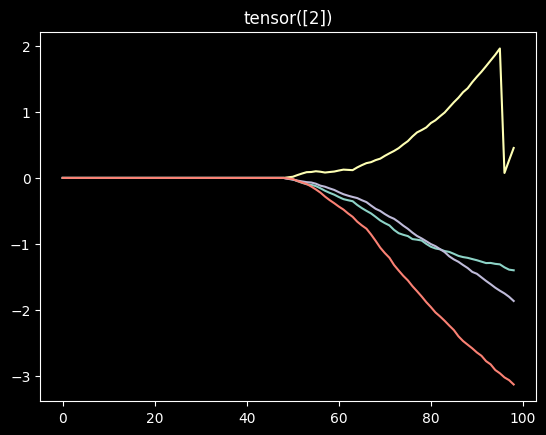

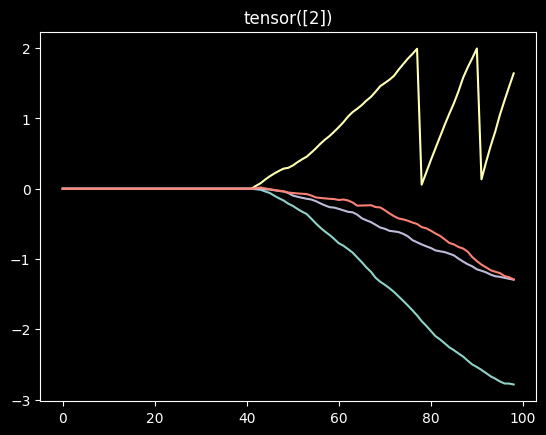

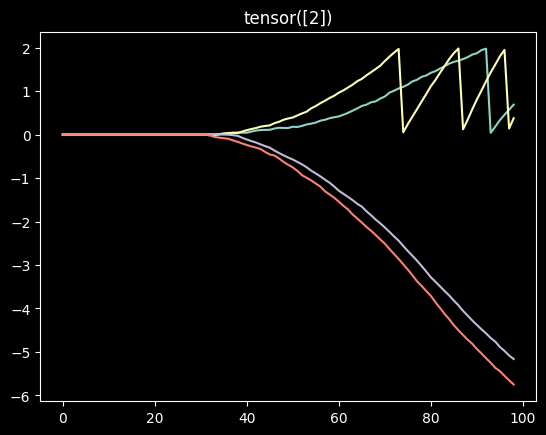

KeyboardInterrupt: 

In [18]:
from torch.nn import CrossEntropyLoss, MSELoss
from torch.optim import Adam, SGD
import torch
from function import *
import matplotlib.pyplot as plt
train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset)//2, shuffle=False)
Nout = 4
criterion = MSELoss()
opt = Adam(snn.parameters().astorch(), lr=0.00172)
losslist = []
accuracy = []
f1s = []
precision = []
recall = []
cmlist= []
for epoch in range(500):
    train_preds = []
    train_targets = []
    sum_loss = 0.0
    for batch, target in (train_dataloader):
        batch = batch.transpose(1, 2)
        batch = batch.to(torch.float32)
        target_loss = (torch.tensor(encode_labels(target,Nout,thr_out))).float()
        snn.reset_state()
        opt.zero_grad()
        out_model, _, rec = snn(batch, record=True)
        plt.plot((rec['spk_out']['vmem'][0]).detach().numpy())
        plt.title(f'{target}')
        plt.show()
        # out = vmem_with_fire(out_model, rec)
        # loss = criterion((out), target_loss)
        # loss.backward()
        # opt.step()